### IMPORT LIBRARIES

In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import random
import seaborn as sns
import csv
import lzma

### FUNCTION DEFINITION

In [2]:
def draw(G, pos, measures, measure_name):
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=100, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1))
    
    # labels = nx.draw_networkx_labels(G, pos)
    edges = nx.draw_networkx_edges(G, pos)

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

### IMPORT GRAPH

In [4]:
g = nx.Graph()
csvfile = csv.reader(lzma.open("./Dataset/soc-redditHyperlinks-title.tsv.xz", mode="rt"), delimiter="\t")
for line in csvfile:
    x, y = line[:2]
    g.add_edge(x, y)

### SUBSAMPLE OF G

In [5]:
k = 10000 #Numero di nodi del sample

sample_nodes = random.sample(g.nodes, k)
g_small = g.subgraph(sample_nodes)

/tmp/ipykernel_5632/830814946.py:3: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  sample_nodes = random.sample(g.nodes, k)


In [6]:
print(nx.info(g_small))

Graph with 10000 nodes and 6329 edges


/tmp/ipykernel_5632/732251648.py:1: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  print(nx.info(g_small))


### GRAPH EXPLORATION

#### PRINT SOME NODES

In [6]:
list(g_small.nodes)[:10]

['fullmetalalchemist',
 'yourselfyou',
 'broforcegame',
 'trendingsubreddits',
 'camarillo',
 'coldplay',
 'papertowns',
 'de_it',
 'fallout_shelter',
 'amazonlumberyard']

##### NETWORK DIAMETER

In [7]:
components = nx.connected_components(g_small)
largest_component = max(components, key=len)
subgraph = g_small.subgraph(largest_component)
diameter = nx.diameter(subgraph)
print("Network diameter: ", diameter)

Network diameter:  12


#### VISUALIZATION WHOLE SAMPLE

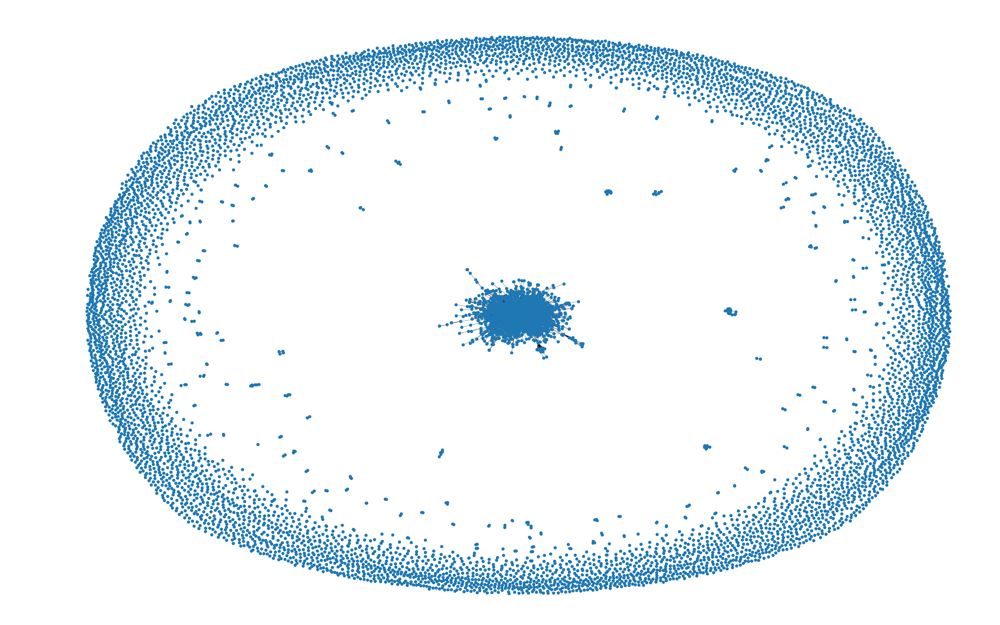

In [8]:
import matplotlib.pyplot as plt
pos = nx.spring_layout(g_small)
plt.figure(figsize=(80,50))
nx.draw(g_small, pos)
plt.show()

##### BIGGEST CONNECTED COMPONENT EXTRACTION & VERIFICATION

In [9]:
g_connected = g_small.subgraph(max(nx.connected_components(g_small), key=len))

In [10]:
print("Graph is connected: " + str(nx.is_connected(g_connected)))
print("Number of different connected components:  " + str(nx.number_connected_components(g_connected)))
print("Number of nodes to be removed (to be disconnected):  " + str(nx.node_connectivity(g_connected)))
print("Number of edges to be removed (to be disconnected):  " + str(nx.edge_connectivity(g_connected)))

Graph is connected: True
Number of different connected components:  1
Number of nodes to be removed (to be disconnected):  1
Number of edges to be removed (to be disconnected):  1


#### SOME PROPERTIES OF CONNECTED GRAPH

In [12]:
print("Radius (minimum eccentricity): " + str(nx.radius(g_connected)))

print("Center: ", list(nx.center(g_connected)))

triadic_closure = nx.transitivity(g_connected)
print("Triadic closure:", triadic_closure)

print("Periphery: ", list(nx.periphery(g_connected)))

Radius (minimum eccentricity): 6
Center:  ['italy', 'hockey', 'legaladvice']
Triadic closure: 0.058959754647305504
Periphery:  ['zinrockin', 'edmcirclejerk', 'twitchbroadcasters']


#### TOP 10 NODES BY CENTRALITY 

In [13]:
degCent = nx.degree_centrality(g_connected)
degCent_sorted=dict(sorted(degCent.items(), key=lambda item: item[1],reverse=True))

print("Top 10 centrality nodes: ")
print(list(degCent_sorted.items())[:10])

Top 10 centrality nodes: 
[('videos', 0.141906096706377), ('news', 0.08829712683952347), ('jokes', 0.03889278206026629), ('india', 0.03679046951646811), ('badphilosophy', 0.03538892782060266), ('documentaries', 0.03433777154870357), ('television', 0.03398738612473721), ('food', 0.03328661527680448), ('evenwithcontext', 0.03258584442887176), ('interestingasfuck', 0.03153468815697267)]


#### SHORTEST PATH BETWEEN TOP 3 NODES BY CENTRALITY

In [ ]:
print("SHORTEST PATH BETWEEN TOP 3 NODES BY CENTRALITY:")
listTop3 = list(degCent_sorted.keys())[:3]
for s in listTop3:
    for t in listTop3:
        if s!=t:
            fell_whitehad_path = nx.shortest_path(g, source=s, target=t)
            print("Path"+ str(s) +" - "+ str(t) + ": ", fell_whitehad_path)

SHORTEST PATH BETWEEN TOP 3 NODES BY CENTRALITY:
Pathsubredditdrama - news:  ['subredditdrama', 'news']
Pathsubredditdrama - science:  ['subredditdrama', 'science']
Pathnews - subredditdrama:  ['news', 'subredditdrama']
Pathnews - science:  ['news', 'science']
Pathscience - subredditdrama:  ['science', 'subredditdrama']
Pathscience - news:  ['science', 'news']


#### AVARAGE CLUSTERING COEFFICIENT

In [ ]:
print("Avarage clustering coefficient: ")
print(nx.average_clustering(g_connected))

Avarage clustering coefficient: 
0.11191033073046762


### VISUALIZATION

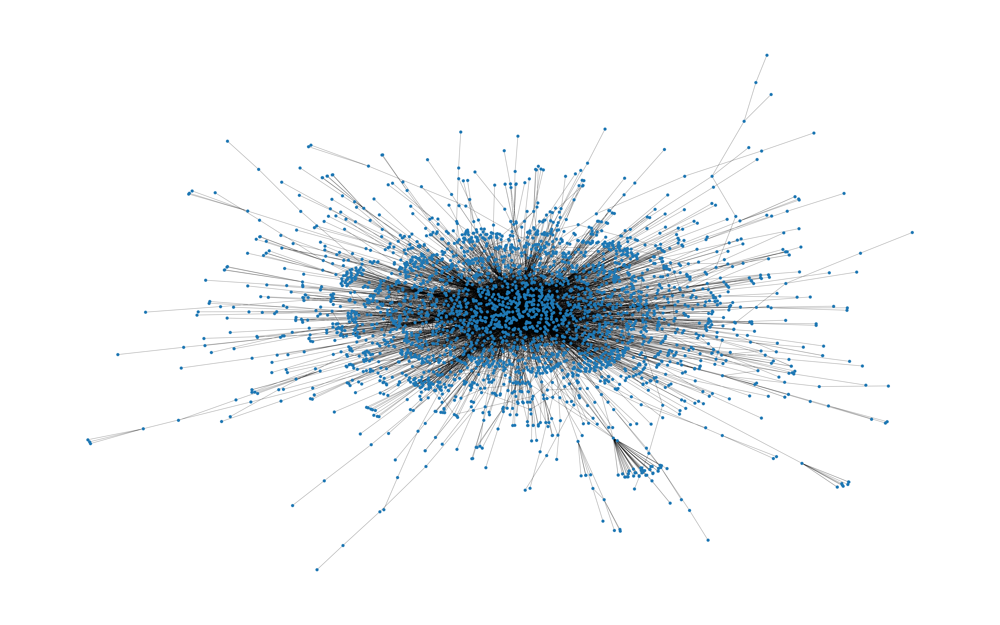

In [ ]:
import matplotlib.pyplot as plt
pos = nx.spring_layout(g_connected)
plt.figure(figsize=(80,50))
nx.draw(g_connected, pos)
plt.show()

C:\Users\crist\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:>

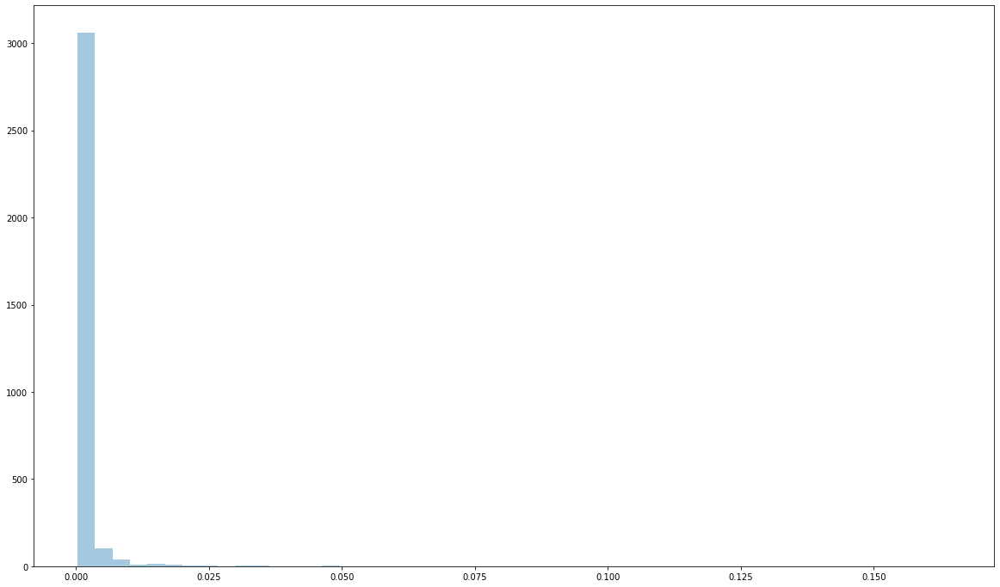

In [ ]:
degree = nx.degree_centrality(g_connected)
plt.figure(figsize=(20,12))
sns.distplot(list(degree.values()), kde=False)

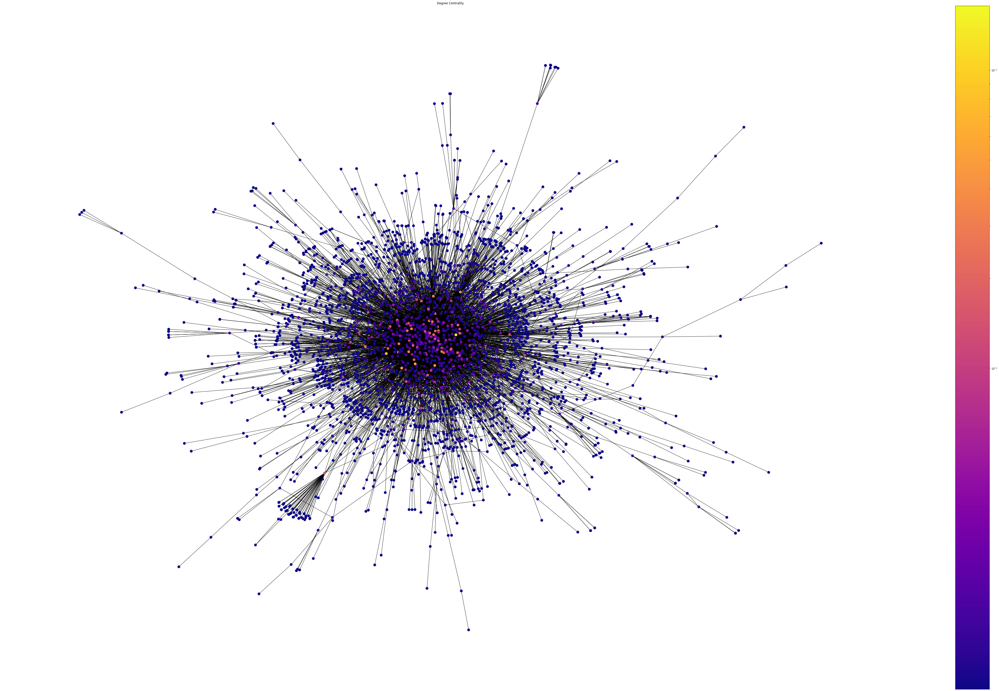

In [ ]:
plt.figure(figsize=(80,50))
pos = nx.spring_layout(g_connected)
draw(g_connected, pos, degree, 'Degree Centrality')

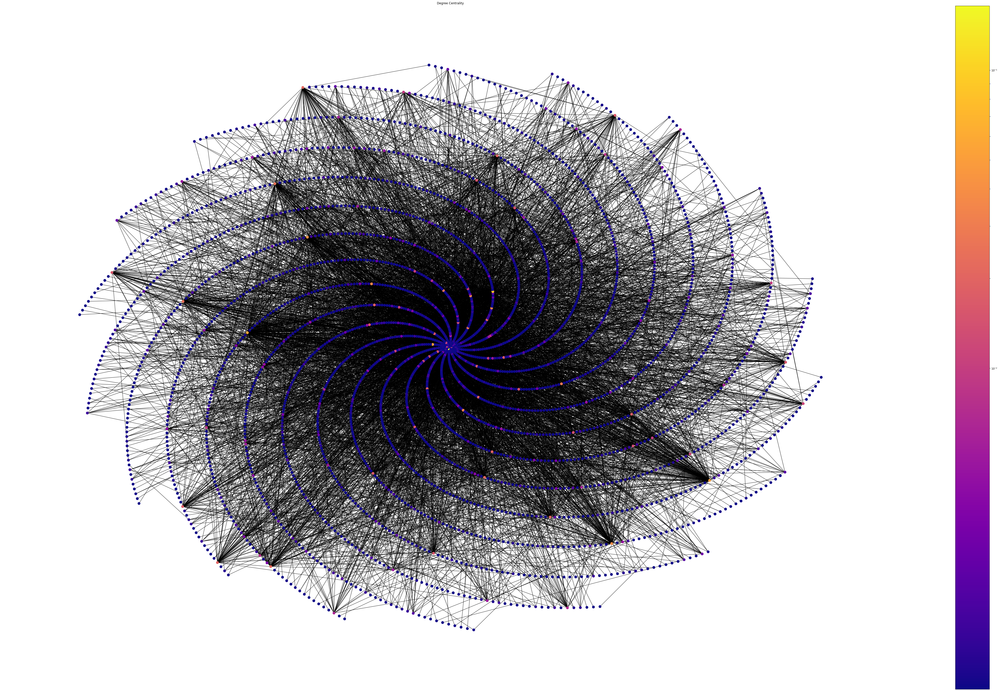

In [ ]:
plt.figure(figsize=(80,50))
pos = nx.spiral_layout(g_connected)
draw(g_connected, pos, degree, 'Degree Centrality')

<AxesSubplot:>

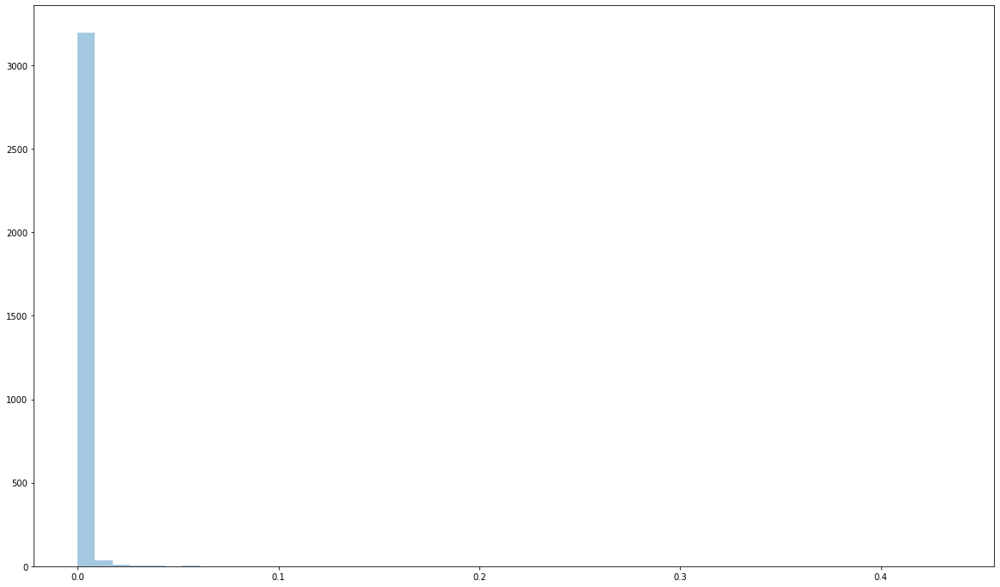

In [ ]:
bet = nx.betweenness_centrality(g_connected)
plt.figure(figsize=(20,12))
sns.distplot(list(bet.values()), kde=False)